<a href="https://colab.research.google.com/github/Majidbouikken/projet_ml_2/blob/main/Projet_HAI923I_Bouikken.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projet Machine Learning 2
##### HAI923I
## Option : Génie Logiciel (GL)


---


Réalisé par :
*   Abdelmadjid BOUIKKEN BAHI AMAR (Nº 22208546)

Encadré par :
*   M. Todorov Konstantin et l'équipe pédagogique





## Installation et Importation des Bibliothèque

In [ ]:
!pip install tensorflow
!pip install umap-learn[plot]
!pip install holoviews
!pip install -U ipykernel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 5.4 MB/s 
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 6.19.0
    Uninstalling ipykernel-6.19.0:
      Successfully uninstalled ipykernel-6.19.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipykernel~=5.3.4, but you have ipykernel 6.19.1 which is incompatible.
google-colab 1.0.0 requires ipython~=7.9.0, but you have ipython 8.7.0 which is incompatible.
google-colab

In [ ]:
#Importation des différentes librairies utiles pour le notebook
#Sickit learn met régulièrement à jour des versions et
#indique des futurs warnings.
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# librairies générales
import pickle
import pandas as pd
from scipy.stats import randint
import numpy as np
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randn
from numpy.random import randint
import string
import time
import base64
import re
import sys
import copy
import random
from numpy import mean
from numpy import std

# librairie affichage
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.graph_objs as go
import plotly.offline as py
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# TensorFlow et keras
import tensorflow as tf
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras_preprocessing.image import img_to_array, load_img
from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2DTranspose, Reshape, LeakyReLU
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Lambda, GlobalAveragePooling2D, Input
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from tqdm import tqdm
from keras.models import load_model
from sklearn.model_selection import KFold
from keras.datasets import fashion_mnist
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.optimizers import SGD, Adam
import os
from os import listdir
from os.path import isfile, join
import cv2
import glob

In [ ]:
# pour monter son drive Google Drive local
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Préparation des jeux de données ainsi que les pré-traitements

Les jeux de données à utiliser sont :
- Tigre vs autres animaux
- Renard vs autres animaux
- Eléphant vs autres animaux.

Les trois jeux de données sont dans des formats différents (différentes hauteurs et largeurs, et 3 canaux RVB).
Comme les entrées des CNN sont de la même taille, nous devons redimensionner les images au même format (124x124).

In [ ]:
!wget https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip

--2022-12-08 12:48:06--  https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip
Resolving www.lirmm.fr (www.lirmm.fr)... 193.49.104.251
Connecting to www.lirmm.fr (www.lirmm.fr)|193.49.104.251|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7605545 (7.3M) [application/zip]
Saving to: ‘Tiger-Fox-Elephant.zip.1’

Tiger-Fox-Elephant. 100%[===================>]   7.25M  7.45MB/s    in 1.0s    

2022-12-08 12:48:08 (7.45 MB/s) - ‘Tiger-Fox-Elephant.zip.1’ saved [7605545/7605545]



In [ ]:
import zipfile
with zipfile.ZipFile("Tiger-Fox-Elephant.zip","r") as zip_ref: zip_ref.extractall("Data_Project")

### Fonctions Utils et Constantes Globales


In [ ]:
# constantes globales
IMG_SIZE = 124 # Taille des images
COLUMNS = 25 # Nombre d'images à afficher
PATH = "Data_Project/Tiger-Fox-Elephant/" # Lien des jeux de données
my_classes_tiger = ['tiger','Tiger_negative_class']
my_classes_fox = ['fox','Fox_negative_class']
my_classes_elephant = ['elephant','Elephant_negative_class']

In [ ]:
# fonctions utils
def create_training_data(path_data, list_classes):
  training_data=[]
  for classes in list_classes:
    path=os.path.join(path_data, classes)
    class_num=list_classes.index(classes)
    for img in os.listdir(path):
      try:
        img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
        new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
        training_data.append([new_array, class_num])
      except Exception as e:
        pass
  return training_data

def create_x_y(path_data, list_classes):
  # récupération des données
  training_data = create_training_data(path_data, list_classes)
  # tri des données
  random.shuffle(training_data)
  # création de x et y
  x=[]
  y=[]
  for features, label in training_data:
    x.append(features)
    y.append(label)
  x=np.array(x).reshape(-1, IMG_SIZE, IMG_SIZE, 3)
  y=np.array(y)
  return x,y

def plot_examples(x,y):
  plt.figure(figsize=(15,15))
  for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    x[i] = cv2.cvtColor(x[i], cv2.COLOR_BGR2RGB)
    plt.imshow(x[i]/255.,cmap=plt.cm.binary)
    plt.xlabel('classe ' + str(y[i]))

def plot_curves_confusion(history, confusion_matrix, class_names):
  plt.figure(1,figsize=(16,6))
  plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
                          top = 0.9, wspace = 0.25, hspace = 0)

  # division de la fenêtre graphique en 1 ligne, 3 colonnes,
  # graphique en position 1 - loss fonction

  plt.subplot(1,3,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['Training loss', 'Validation loss'], loc='upper left')
  # graphique en position 2 - accuracy
  plt.subplot(1,3,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')
  
  # matrice de correlation
  plt.subplot(1,3,3)
  sns.heatmap(conf,annot=True,fmt="d", cmap='YlGnBu', xticklabels=class_names, yticklabels=class_names)# label=class_names)
  # labels, title and ticks
  plt.xlabel('Predicted', fontsize=12)
  #plt.set_label_position('top') 
  #plt.set_ticklabels(class_names, fontsize = 8)
  #plt.tick_top()
  plt.title("Correlation matrix")
  plt.ylabel('True', fontsize=12)
  #plt.set_ticklabels(class_names, fontsize = 8)
  plt.show()

def plot_curves(histories):
  plt.figure(1,figsize=(16,6))
  plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
  top = 0.9, wspace = 0.25, hspace = 0)
  for i in range(len(histories)):
    # plot loss
    plt.subplot(121)
    plt.title('Cross Entropy Loss')
    plt.plot(histories[i].history['loss'], color='blue', label='train')
    plt.plot(histories[i].history['val_loss'], color='red', label='test')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['Training loss', 'Validation loss'], loc='upper left')
    # plot accuracy
    plt.subplot(122)
    plt.title('Classification Accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.plot(histories[i].history['accuracy'], color='blue', label='train')
    plt.plot(histories[i].history['val_accuracy'], color='red', label='test')
    plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')
  plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
def load_dataset(X, y ):
    validation_size=0.6 #40% du jeu de données pour le test
    testsize = 1-validation_size
    seed=30
  
    # Chargement des données
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=validation_size ,random_state=seed, test_size=testsize)
    # ne considérer qu'un seul canal
    X_train = X_train.reshape((X_train.shape[0], 124, 124, 3))
    X_test = X_test.reshape((X_test.shape[0], 124, 124, 3))
    # one hot encoding
  
    return X_train, y_train, X_test, y_test

In [ ]:
def clean_data(train, test):
  # convertion d'entier en float
  train_norm = train.astype('float32')
  test_norm = test.astype('float32')
  # normalisation entre 0 et 1
  train_norm = train_norm / 255.0
  test_norm = test_norm / 255.0
  return train_norm, test_norm

### Affichage et préparation des trois jeux de données

Jeu de données Tiger :

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (124, 124, 3)
Distribution des labels dans le jeu d'apprentissage


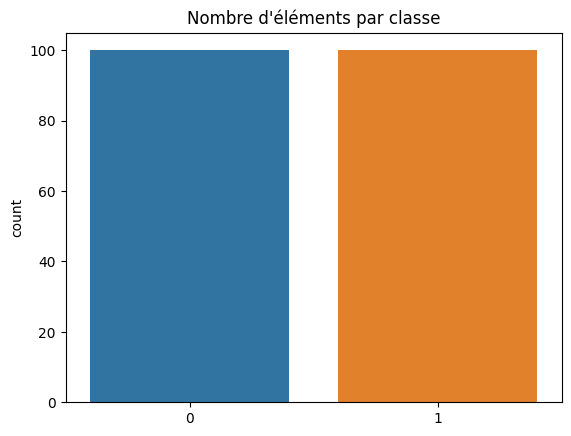

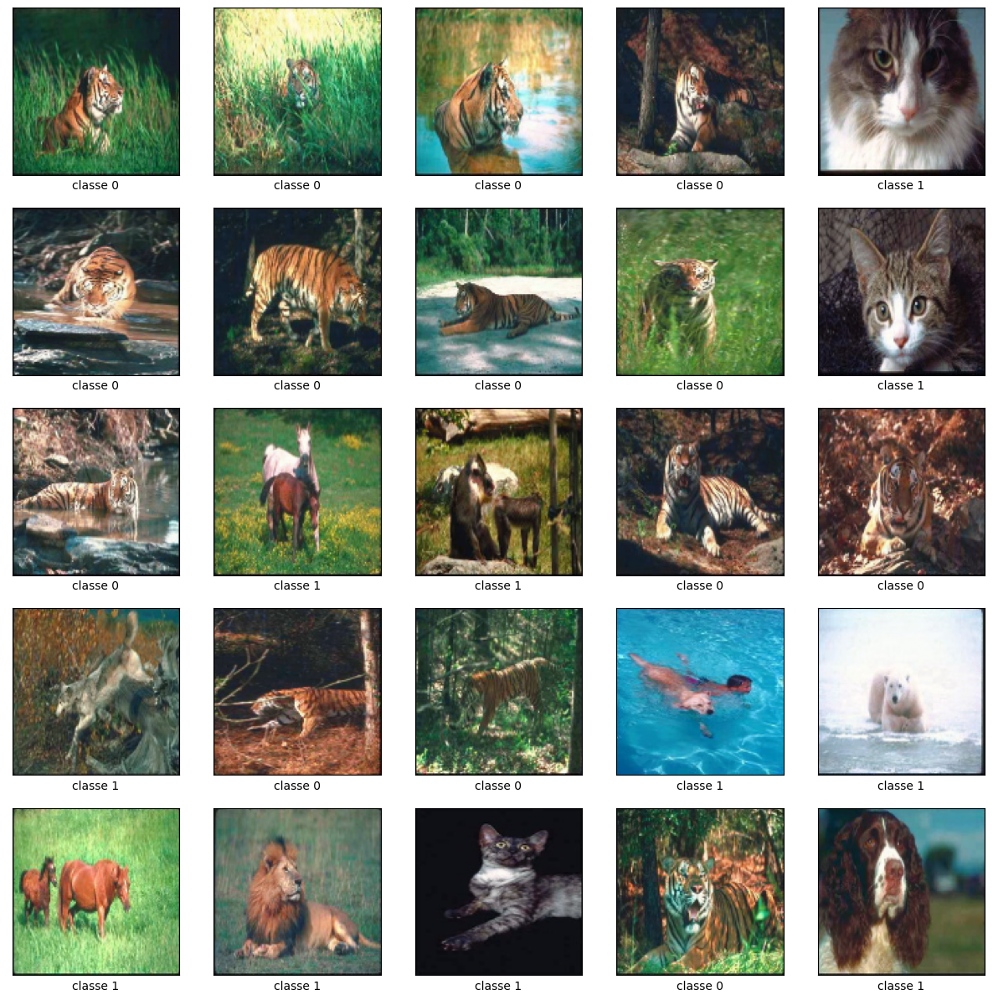

In [ ]:
x_tiger, y_tiger = create_x_y(PATH, my_classes_tiger)
print("Nombre de données : ", x_tiger.shape[0])
print("Taille d'une image pour connaître l'input du réseau", x_tiger[0].shape)
print("Distribution des labels dans le jeu d'apprentissage")
sns.countplot(np.array(y_tiger))
plt.title("Nombre d'éléments par classe")

# affichage
plot_examples(x_tiger, y_tiger)

# préparation du jeu de données pour le traitement
X_tiger_train, y_tiger_train, X_tiger_test, y_tiger_test = load_dataset(x_tiger, y_tiger)
X_tiger_train, X_tiger_test = clean_data(X_tiger_train, X_tiger_test)

Jeu de données Fox :

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (124, 124, 3)
Distribution des labels dans le jeu d'apprentissage


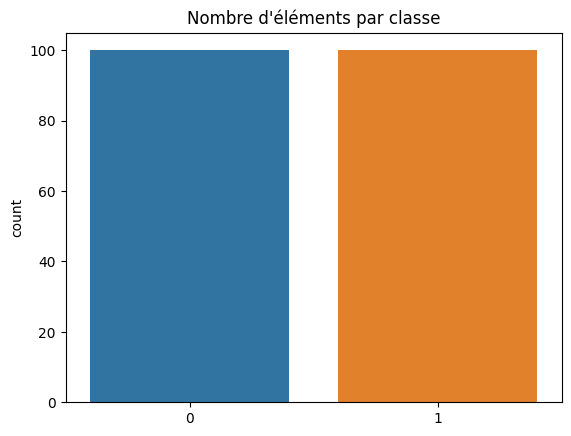

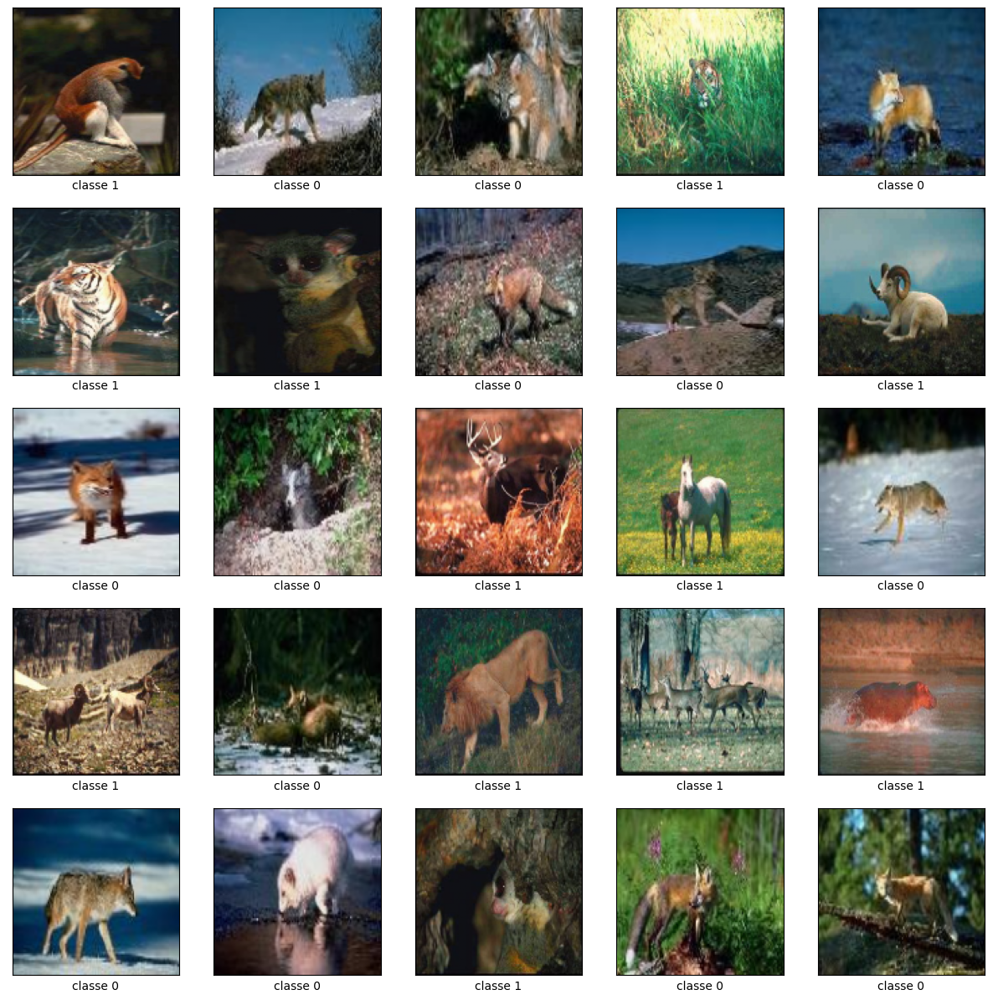

In [ ]:
x_fox, y_fox = create_x_y(PATH, my_classes_fox)
print ("Nombre de données : ", x_fox.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", x_fox[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
sns.countplot(np.array(y_fox))
plt.title("Nombre d'éléments par classe")

# Affichage
plot_examples(x_fox, y_fox)

# préparation du jeu de données pour le traitement
X_fox_train, y_fox_train, X_fox_test, y_fox_test = load_dataset(x_fox, y_fox)
X_fox_train, X_fox_test = clean_data(X_fox_train, X_fox_test)

Jeu de données Elephant :

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (124, 124, 3)
Distribution des labels dans le jeu d'apprentissage


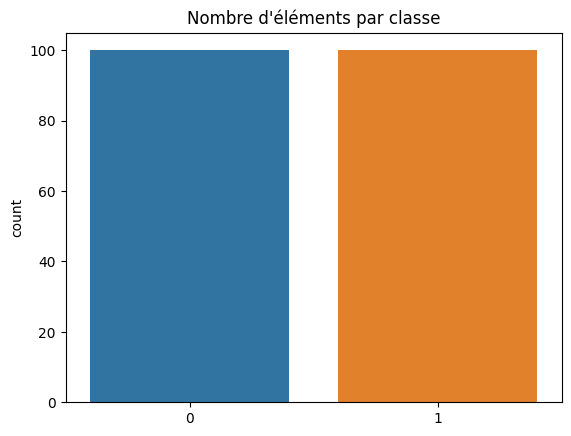

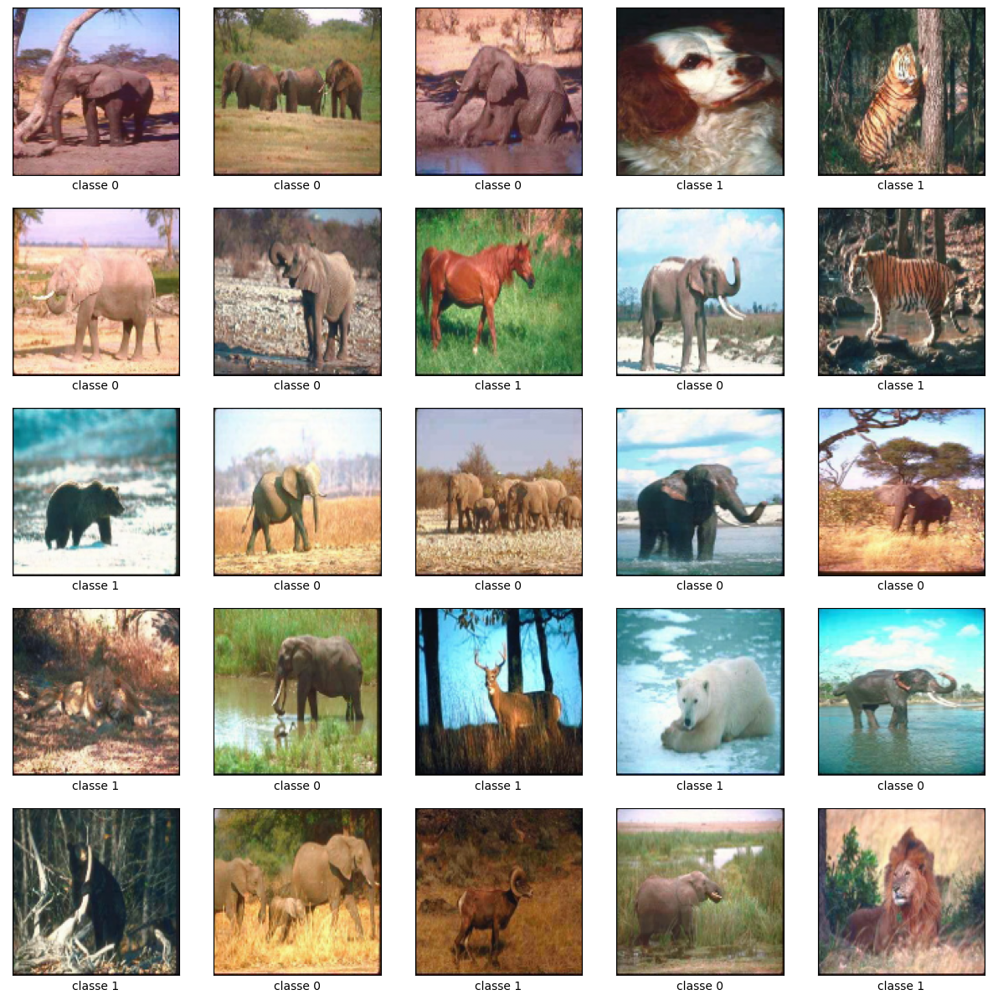

In [ ]:
x_elephant, y_elephant = create_x_y(PATH, my_classes_elephant)
print ("Nombre de données : ", x_elephant.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", x_elephant[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
sns.countplot(np.array(y_elephant))
plt.title("Nombre d'éléments par classe")

# affichage
plot_examples(x_elephant, y_elephant)

# préparation du jeu de données pour le traitement
X_elephant_train, y_elephant_train, X_elephant_test, y_elephant_test = load_dataset(x_elephant, y_elephant)
X_elephant_train, X_elephant_test = clean_data(X_elephant_train, X_elephant_test)

## 1. Les modèles de classifier de base

Dans cette section, nous créons des classifiers de base pour chacun des jeux d'essais, nous utiliserons ces classifiers pour comparer dans ce qui suit

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Flatten
  model.add(Flatten())
  # Partie classification
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

In [ ]:
def evaluate_model(model, dataX, dataY, n_folds=5, epochs=10):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    # Parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        model = define_model()
        # Selection des données
        x_train, y_train, x_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]
	      # Nettoyage et normalisation
        #x_train, x_test = clean_data(x_train, x_test)
        # Fit du modele
        history = model.fit(x_train, y_train, epochs=epochs, batch_size=32, validation_data=(x_test, y_test), verbose=1)
        # Evaluate du modele
        loss, acc = model.evaluate(x_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories

In [ ]:
def run_evaluation(model, X_train, y_train, X_test, y_test, n_folds, epochs):
	# model summary
	print(model.summary())
	# evaluate model
	targets = np.concatenate((y_train, y_test), axis=0)
	inputs = np.concatenate((X_train, X_test), axis=0)
	scores, histories = evaluate_model(model, inputs, targets, n_folds, epochs)
	plot_curves(histories)
	print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))

### modelebaselineTiger

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_40 (Conv2D)          (None, 122, 122, 64)      1792      
                                                                 
 max_pooling2d_40 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                            
                                                                 
 flatten_14 (Flatten)        (None, 238144)            0         
                                                                 
 dense_27 (Dense)            (None, 1)                 238145    
                                                                 
Total params: 239,937
Trainable params: 239,937
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/20
5/5 [==============================] - 3s 429ms/step - loss: 1.8353 - accuracy: 0.4875 - val_loss

/tmp/ipykernel_21179/3874490099.py:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/tmp/ipykernel_21179/3874490099.py:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



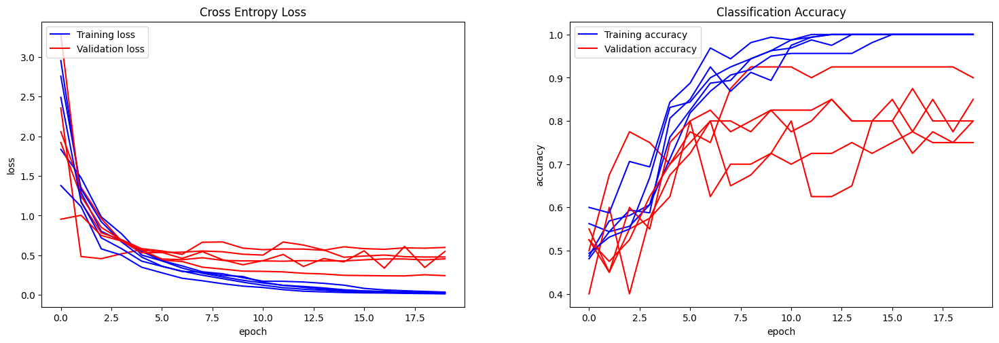

Accuracy: mean=82.000 std=5.099, n=5


In [ ]:
n_folds=5
epochs=20
modelebaselineTiger = define_model()
run_evaluation(modelebaselineTiger, X_tiger_train, y_tiger_train, X_tiger_test, y_tiger_test, n_folds, epochs)

In [ ]:
modelebaselineTiger = define_model()
history = modelebaselineTiger.fit(X_tiger_train, y_tiger_train, validation_data=(X_tiger_test, y_tiger_test), epochs=epochs, batch_size=32)

Epoch 1/20
4/4 [==============================] - 2s 463ms/step - loss: 3.1043 - accuracy: 0.4917 - val_loss: 5.8531 - val_accuracy: 0.4250
Epoch 2/20
4/4 [==============================] - 2s 436ms/step - loss: 3.8886 - accuracy: 0.5500 - val_loss: 1.7823 - val_accuracy: 0.4250
Epoch 3/20
4/4 [==============================] - 2s 421ms/step - loss: 0.9394 - accuracy: 0.5667 - val_loss: 1.1217 - val_accuracy: 0.5875
Epoch 4/20
4/4 [==============================] - 2s 409ms/step - loss: 1.1779 - accuracy: 0.4750 - val_loss: 0.5907 - val_accuracy: 0.6750
Epoch 5/20
4/4 [==============================] - 2s 416ms/step - loss: 0.5821 - accuracy: 0.6583 - val_loss: 0.9815 - val_accuracy: 0.4250
Epoch 6/20
4/4 [==============================] - 2s 425ms/step - loss: 0.6130 - accuracy: 0.5917 - val_loss: 0.6646 - val_accuracy: 0.5625
Epoch 7/20
4/4 [==============================] - 2s 420ms/step - loss: 0.4957 - accuracy: 0.8167 - val_loss: 0.5785 - val_accuracy: 0.7750
Epoch 8/20
4/4 [====

3/3 [==============================] - 0s 72ms/step
Accuracy sur le jeu de test 0.575


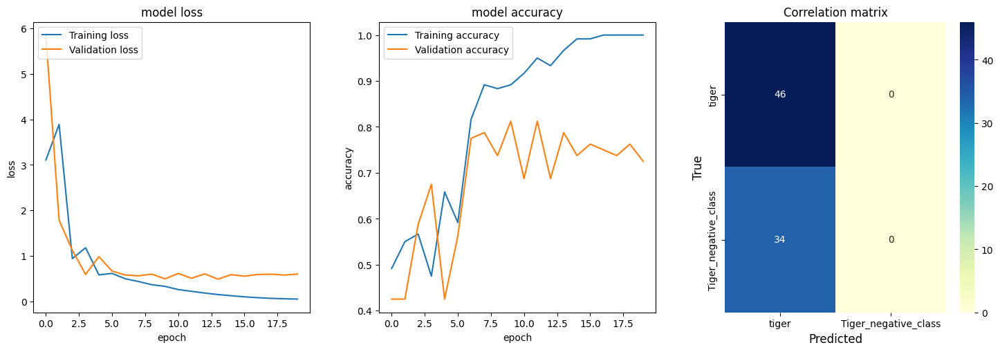

In [ ]:
predict_y = modelebaselineTiger.predict(X_tiger_test)
y_pred = np.argmax(predict_y, axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_tiger_test, y_pred))
conf = confusion_matrix(y_tiger_test, y_pred)
plot_curves_confusion(history, conf, my_classes_tiger)

### modelebaselineFox

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_61 (Conv2D)          (None, 122, 122, 64)      1792      
                                                                 
 max_pooling2d_61 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                            
                                                                 
 flatten_35 (Flatten)        (None, 238144)            0         
                                                                 
 dense_48 (Dense)            (None, 1)                 238145    
                                                                 
Total params: 239,937
Trainable params: 239,937
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/20
5/5 [==============================] - 3s 448ms/step - loss: 4.1177 - accuracy: 0.4688 - val_loss

/tmp/ipykernel_21179/3874490099.py:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/tmp/ipykernel_21179/3874490099.py:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



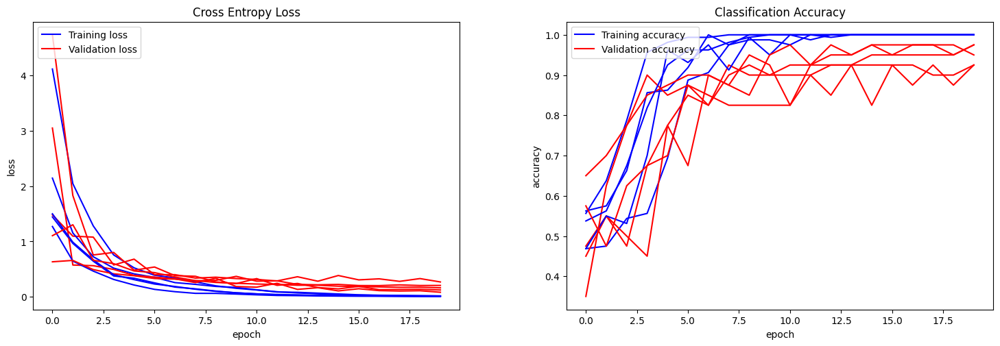

Accuracy: mean=95.000 std=2.236, n=5


In [ ]:
n_folds=5
epochs=20
modelebaselineFox = define_model()
run_evaluation(modelebaselineFox, X_fox_train, y_fox_train, X_fox_test, y_fox_test, n_folds, epochs)

In [ ]:
modelebaselineFox = define_model()
history = modelebaselineFox.fit(X_fox_train, y_fox_train, validation_data=(X_fox_test, y_fox_test), epochs=epochs, batch_size=32)

Epoch 1/20
4/4 [==============================] - 2s 459ms/step - loss: 3.6151 - accuracy: 0.4000 - val_loss: 2.1755 - val_accuracy: 0.5000
Epoch 2/20
4/4 [==============================] - 2s 405ms/step - loss: 1.4492 - accuracy: 0.5417 - val_loss: 1.2640 - val_accuracy: 0.4875
Epoch 3/20
4/4 [==============================] - 2s 421ms/step - loss: 0.8712 - accuracy: 0.6000 - val_loss: 0.7209 - val_accuracy: 0.5875
Epoch 4/20
4/4 [==============================] - 2s 421ms/step - loss: 0.6157 - accuracy: 0.6083 - val_loss: 0.6346 - val_accuracy: 0.6875
Epoch 5/20
4/4 [==============================] - 2s 404ms/step - loss: 0.3991 - accuracy: 0.8500 - val_loss: 0.6207 - val_accuracy: 0.6750
Epoch 6/20
4/4 [==============================] - 2s 407ms/step - loss: 0.3238 - accuracy: 0.9083 - val_loss: 0.6774 - val_accuracy: 0.6875
Epoch 7/20
4/4 [==============================] - 2s 402ms/step - loss: 0.2621 - accuracy: 0.9333 - val_loss: 0.4855 - val_accuracy: 0.7625
Epoch 8/20
4/4 [====

3/3 [==============================] - 0s 68ms/step
Accuracy sur le jeu de test 0.5


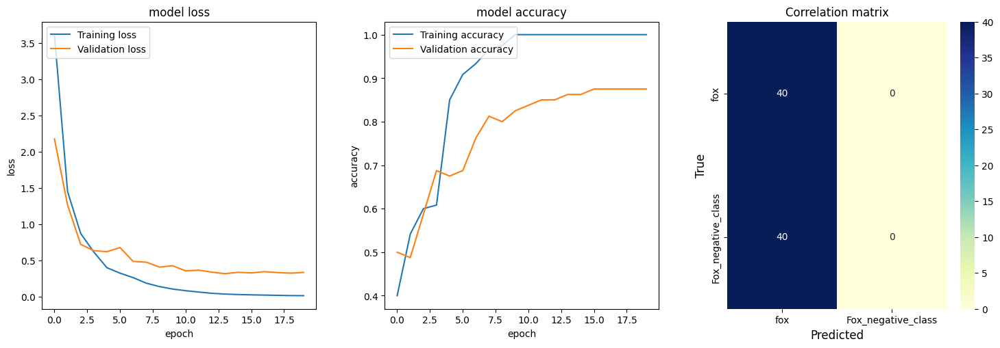

In [ ]:
predict_y = modelebaselineFox.predict(X_fox_test)
y_pred = np.argmax(predict_y, axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_fox_test, y_pred))
conf = confusion_matrix(y_fox_test, y_pred)
plot_curves_confusion(history, conf, my_classes_fox)



---



### modelebaselineElephant

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_68 (Conv2D)          (None, 122, 122, 64)      1792      
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 61, 61, 64)       0         
 g2D)                                                            
                                                                 
 flatten_42 (Flatten)        (None, 238144)            0         
                                                                 
 dense_55 (Dense)            (None, 1)                 238145    
                                                                 
Total params: 239,937
Trainable params: 239,937
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/20
5/5 [==============================] - 3s 439ms/step - loss: 3.9659 - accuracy: 0.4688 - val_loss

/tmp/ipykernel_21179/3874490099.py:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/tmp/ipykernel_21179/3874490099.py:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



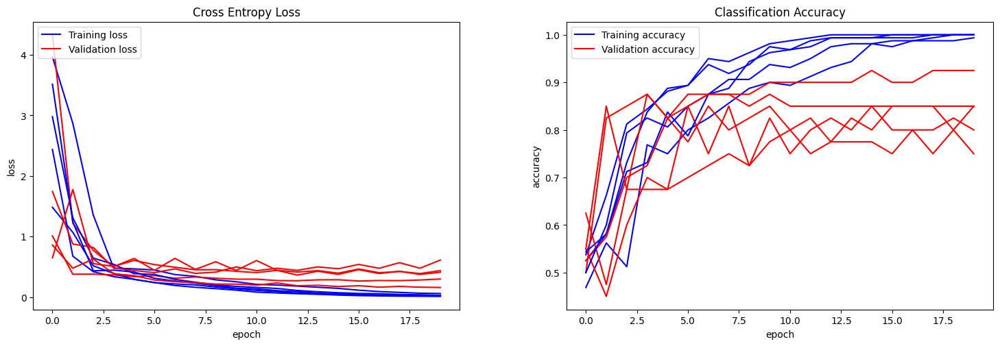

Accuracy: mean=83.500 std=5.831, n=5


In [ ]:
n_folds=5
epochs=20
modelebaselineElephant = define_model()
run_evaluation(modelebaselineElephant, X_elephant_train, y_elephant_train, X_elephant_test, y_elephant_test, n_folds, epochs)

In [ ]:
modelebaselineElephant = define_model()
history = modelebaselineElephant.fit(X_elephant_train, y_elephant_train, validation_data=(X_elephant_test, y_elephant_test), epochs=epochs, batch_size=32)

Epoch 1/20
4/4 [==============================] - 2s 470ms/step - loss: 1.5744 - accuracy: 0.5333 - val_loss: 2.0549 - val_accuracy: 0.5000
Epoch 2/20
4/4 [==============================] - 2s 425ms/step - loss: 1.0392 - accuracy: 0.6417 - val_loss: 1.1111 - val_accuracy: 0.5875
Epoch 3/20
4/4 [==============================] - 2s 419ms/step - loss: 0.6072 - accuracy: 0.7417 - val_loss: 0.6478 - val_accuracy: 0.6875
Epoch 4/20
4/4 [==============================] - 2s 416ms/step - loss: 0.4520 - accuracy: 0.7917 - val_loss: 0.7233 - val_accuracy: 0.7000
Epoch 5/20
4/4 [==============================] - 2s 405ms/step - loss: 0.3460 - accuracy: 0.8583 - val_loss: 0.5542 - val_accuracy: 0.7375
Epoch 6/20
4/4 [==============================] - 2s 412ms/step - loss: 0.3129 - accuracy: 0.8583 - val_loss: 0.4772 - val_accuracy: 0.7750
Epoch 7/20
4/4 [==============================] - 2s 416ms/step - loss: 0.2552 - accuracy: 0.8833 - val_loss: 0.4293 - val_accuracy: 0.8250
Epoch 8/20
4/4 [====

3/3 [==============================] - 0s 75ms/step
Accuracy sur le jeu de test 0.4875


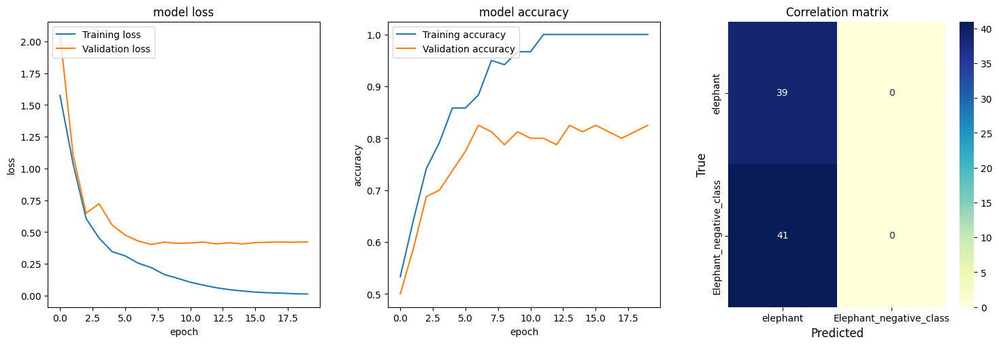

In [ ]:
predict_y = modelebaselineElephant.predict(X_tiger_test)
y_pred = np.argmax(predict_y, axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_elephant_test, y_pred))
conf = confusion_matrix(y_elephant_test, y_pred)
plot_curves_confusion(history, conf, my_classes_elephant)

## 2. Amélioration des modèles

### modeleTiger

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling 1
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Convolution and pooling 2
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 1
  model.add(Dropout(0.4))
  # Convolution and pooling 3
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Convolution and pooling 4
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 2
  model.add(Dropout(0.4))
  # Flatten
  model.add(Flatten())
  # Dropouts 3
  model.add(Dropout(0.4))
  # Partie classification
  model.add(Dense(units=256, activation='relu'))
  # Dropouts 4
  model.add(Dropout(0.4))
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_180 (Conv2D)         (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d_180 (MaxPooli  (None, 61, 61, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_181 (Conv2D)         (None, 59, 59, 32)        9248      
                                                                 
 max_pooling2d_181 (MaxPooli  (None, 29, 29, 32)       0         
 ng2D)                                                           
                                                                 
 dropout_172 (Dropout)       (None, 29, 29, 32)        0         
                                                                 
 conv2d_182 (Conv2D)         (None, 27, 27, 64)      

/tmp/ipykernel_56745/3874490099.py:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/tmp/ipykernel_56745/3874490099.py:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



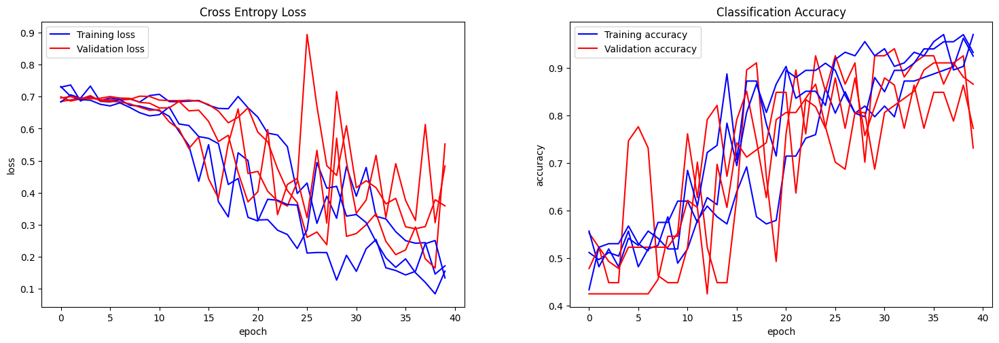

Accuracy: mean=78.991 std=5.617, n=3


In [ ]:
n_folds=3
epochs=40
modeleTiger = define_model()
run_evaluation(modeleTiger, X_tiger_train, y_tiger_train, X_tiger_test, y_tiger_test, n_folds, epochs)

In [ ]:
modeleTiger = define_model()
history= modeleTiger.fit(X_tiger_train, y_tiger_train, validation_data=(X_tiger_test, y_tiger_test), epochs=epochs, batch_size=32)

Epoch 1/40
4/4 [==============================] - 1s 95ms/step - loss: 0.7075 - accuracy: 0.4250 - val_loss: 0.7142 - val_accuracy: 0.4500
Epoch 2/40
4/4 [==============================] - 0s 46ms/step - loss: 0.7181 - accuracy: 0.5167 - val_loss: 0.6904 - val_accuracy: 0.5250
Epoch 3/40
4/4 [==============================] - 0s 32ms/step - loss: 0.6941 - accuracy: 0.5417 - val_loss: 0.6909 - val_accuracy: 0.5750
Epoch 4/40
4/4 [==============================] - 0s 44ms/step - loss: 0.6781 - accuracy: 0.5417 - val_loss: 0.6934 - val_accuracy: 0.4500
Epoch 5/40
4/4 [==============================] - 0s 45ms/step - loss: 0.6605 - accuracy: 0.5833 - val_loss: 0.7019 - val_accuracy: 0.4500
Epoch 6/40
4/4 [==============================] - 0s 29ms/step - loss: 0.7015 - accuracy: 0.5250 - val_loss: 0.6931 - val_accuracy: 0.4500
Epoch 7/40
4/4 [==============================] - 0s 43ms/step - loss: 0.6799 - accuracy: 0.5500 - val_loss: 0.6872 - val_accuracy: 0.6375
Epoch 8/40
4/4 [===========

3/3 [==============================] - 0s 6ms/step
Accuracy sur le jeu de test 0.45


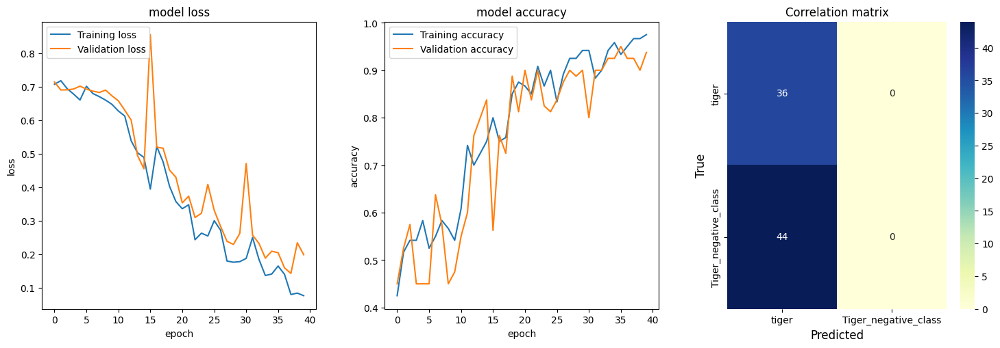

In [ ]:
predict_y = modeleTiger.predict(X_tiger_test)
y_pred = np.argmax(predict_y,axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_tiger_test, y_pred))
conf = confusion_matrix(y_tiger_test, y_pred)
plot_curves_confusion(history, conf, my_classes_tiger)

### modeleFox

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling 1
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 1
  model.add(Dropout(0.4))
  # Convolution and pooling 3
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 2
  model.add(Dropout(0.4))
  # Flatten
  model.add(Flatten())
  # Dropouts 3
  model.add(Dropout(0.4))
  # Partie classification
  model.add(Dense(units=256, activation='relu'))
  # Dropouts 4
  model.add(Dropout(0.4))
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Model: "sequential_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_218 (Conv2D)         (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d_218 (MaxPooli  (None, 61, 61, 32)       0         
 ng2D)                                                           
                                                                 
 dropout_230 (Dropout)       (None, 61, 61, 32)        0         
                                                                 
 conv2d_219 (Conv2D)         (None, 59, 59, 64)        18496     
                                                                 
 max_pooling2d_219 (MaxPooli  (None, 29, 29, 64)       0         
 ng2D)                                                           
                                                                 
 dropout_231 (Dropout)       (None, 29, 29, 64)      

/tmp/ipykernel_56745/3874490099.py:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/tmp/ipykernel_56745/3874490099.py:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



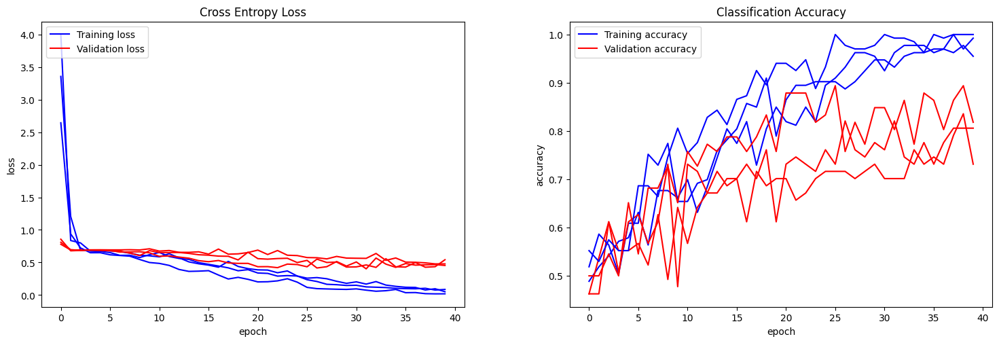

Accuracy: mean=78.517 std=3.838, n=3


In [ ]:
n_folds=3
epochs=40
modeleFox = define_model()
run_evaluation(modeleFox, X_fox_train, y_fox_train, X_fox_test, y_fox_test, n_folds, epochs)

In [ ]:
modeleFox = define_model()
history= modeleFox.fit(X_fox_train, y_fox_train, validation_data=(X_fox_test, y_fox_test), epochs=epochs, batch_size=32)

Epoch 1/40
4/4 [==============================] - 1s 132ms/step - loss: 2.8044 - accuracy: 0.4917 - val_loss: 0.8011 - val_accuracy: 0.4875
Epoch 2/40
4/4 [==============================] - 0s 48ms/step - loss: 1.5383 - accuracy: 0.5083 - val_loss: 0.6873 - val_accuracy: 0.5375
Epoch 3/40
4/4 [==============================] - 0s 47ms/step - loss: 0.7774 - accuracy: 0.5167 - val_loss: 0.7029 - val_accuracy: 0.5125
Epoch 4/40
4/4 [==============================] - 0s 46ms/step - loss: 0.7228 - accuracy: 0.4917 - val_loss: 0.6929 - val_accuracy: 0.5125
Epoch 5/40
4/4 [==============================] - 0s 45ms/step - loss: 0.6920 - accuracy: 0.5250 - val_loss: 0.6925 - val_accuracy: 0.5750
Epoch 6/40
4/4 [==============================] - 0s 34ms/step - loss: 0.6805 - accuracy: 0.6417 - val_loss: 0.6918 - val_accuracy: 0.5500
Epoch 7/40
4/4 [==============================] - 0s 47ms/step - loss: 0.6693 - accuracy: 0.6083 - val_loss: 0.6877 - val_accuracy: 0.5000
Epoch 8/40
4/4 [==========

3/3 [==============================] - 0s 7ms/step
Accuracy sur le jeu de test 0.5125


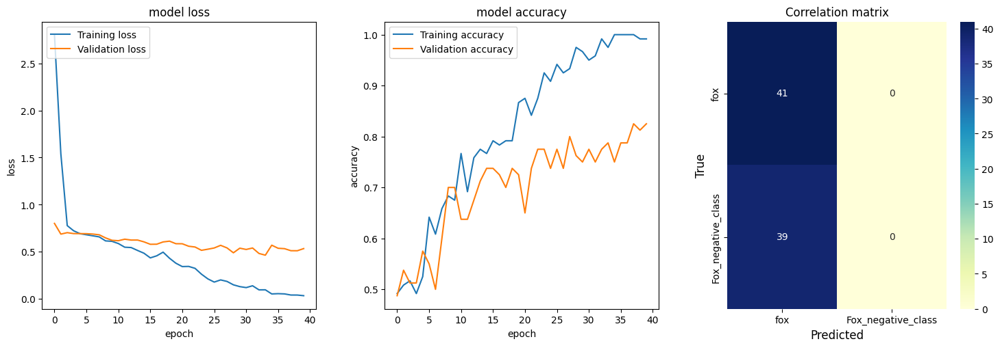

In [ ]:
predict_y = modeleFox.predict(X_fox_test)
y_pred=np.argmax(predict_y,axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_fox_test, y_pred))
conf=confusion_matrix(y_fox_test,y_pred)
plot_curves_confusion(history,conf,my_classes_fox)

### modeleElephant

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling 1
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 1
  model.add(Dropout(0.4))
  # Convolution and pooling 3
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 2
  model.add(Dropout(0.4))
  # Flatten
  model.add(Flatten())
  # Dropouts 3
  model.add(Dropout(0.4))
  # Partie classification
  model.add(Dense(units=256, activation='relu'))
  # Dropouts 4
  model.add(Dropout(0.4))
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.002)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Model: "sequential_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_280 (Conv2D)         (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d_280 (MaxPooli  (None, 61, 61, 32)       0         
 ng2D)                                                           
                                                                 
 dropout_354 (Dropout)       (None, 61, 61, 32)        0         
                                                                 
 conv2d_281 (Conv2D)         (None, 59, 59, 64)        18496     
                                                                 
 max_pooling2d_281 (MaxPooli  (None, 29, 29, 64)       0         
 ng2D)                                                           
                                                                 
 dropout_355 (Dropout)       (None, 29, 29, 64)      

/tmp/ipykernel_56745/3874490099.py:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/tmp/ipykernel_56745/3874490099.py:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



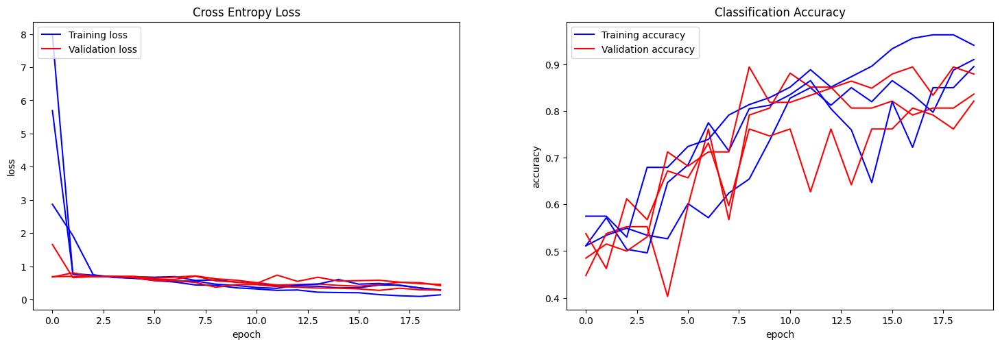

Accuracy: mean=84.517 std=2.454, n=3


In [ ]:
n_folds=3
epochs=20
modeleElephant = define_model()
run_evaluation(modeleElephant, X_elephant_train, y_elephant_train, X_elephant_test, y_elephant_test, n_folds, epochs)

In [ ]:
modeleElephant = define_model()
history= modeleElephant.fit(X_elephant_train, y_elephant_train, validation_data=(X_elephant_test, y_elephant_test), epochs=epochs, batch_size=32)

Epoch 1/20
4/4 [==============================] - 1s 84ms/step - loss: 7.6932 - accuracy: 0.4833 - val_loss: 1.2955 - val_accuracy: 0.5375
Epoch 2/20
4/4 [==============================] - 0s 36ms/step - loss: 2.9590 - accuracy: 0.5167 - val_loss: 0.7188 - val_accuracy: 0.4625
Epoch 3/20
4/4 [==============================] - 0s 49ms/step - loss: 0.7323 - accuracy: 0.5250 - val_loss: 0.7329 - val_accuracy: 0.4625
Epoch 4/20
4/4 [==============================] - 0s 47ms/step - loss: 0.6956 - accuracy: 0.5417 - val_loss: 0.6931 - val_accuracy: 0.4625
Epoch 5/20
4/4 [==============================] - 0s 46ms/step - loss: 0.6719 - accuracy: 0.6000 - val_loss: 0.6765 - val_accuracy: 0.7250
Epoch 6/20
4/4 [==============================] - 0s 34ms/step - loss: 0.6609 - accuracy: 0.6167 - val_loss: 0.6632 - val_accuracy: 0.7250
Epoch 7/20
4/4 [==============================] - 0s 32ms/step - loss: 0.5943 - accuracy: 0.7583 - val_loss: 0.6163 - val_accuracy: 0.6875
Epoch 8/20
4/4 [===========

3/3 [==============================] - 0s 9ms/step
Accuracy sur le jeu de test 0.5375


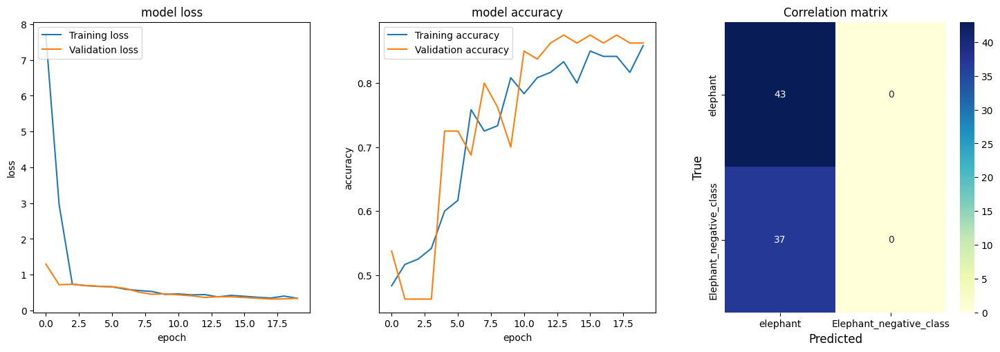

In [ ]:
predict_y = modeleElephant.predict(X_elephant_test)
y_pred = np.argmax(predict_y,axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_elephant_test, y_pred))
conf=confusion_matrix(y_elephant_test,y_pred)
plot_curves_confusion(history,conf,my_classes_elephant)

## 3. Génération des nouvelles données d'image

In [ ]:
# Établissement du Image Data Generator avec une plage de rotation de 40,
# un décalage hotizontale et verticale de 0.1, une portée du zoom de 0.2,
# avec le horizontal flip et un mode de remplissage reflet
datagen = ImageDataGenerator(rotation_range=40, width_shift_range=0.1, height_shift_range=0.1, zoom_range=0.2, fill_mode="reflect", horizontal_flip=True)

In [ ]:
def evaluate_model(model, dataX, dataY, datagen, n_folds=5, epochs=10):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        # selection des données
        model = define_model()
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]
        # fit du modele
        history = model.fit(datagen.flow(X_train, y_train, batch_size=32), epochs=epochs, batch_size=32, validation_data=(X_test, y_test), verbose=1)
        # evaluate du modele
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories

In [ ]:
def run_evaluation(model, X_train, y_train, X_test, y_test, n_folds, epochs):
  # On affiche le summary du modèle
  print (model.summary())
  # Préparation de l'itérateur pour remplir les batchs
  targets = np.concatenate((y_train, y_test), axis=0)
  inputs = np.concatenate((X_train, X_test), axis=0)
  # Evaluation du modèle
  scores, histories = evaluate_model(model, inputs, targets, datagen, n_folds, epochs)
  plot_curves(histories)
  print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))

### modeleIDGTiger

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling 1
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Convolution and pooling 2
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 1
  model.add(Dropout(0.3))
  # Convolution and pooling 3
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Convolution and pooling 4
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 2
  model.add(Dropout(0.3))
  # Flatten
  model.add(Flatten())
  # Dropouts 3
  model.add(Dropout(0.3))
  # Partie classification
  model.add(Dense(units=256, activation='relu'))
  # Dropouts 4
  model.add(Dropout(0.4))
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_179 (Conv2D)         (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d_102 (MaxPooli  (None, 61, 61, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_180 (Conv2D)         (None, 59, 59, 32)        9248      
                                                                 
 max_pooling2d_103 (MaxPooli  (None, 29, 29, 32)       0         
 ng2D)                                                           
                                                                 
 dropout_136 (Dropout)       (None, 29, 29, 32)        0         
                                                                 
 conv2d_181 (Conv2D)         (None, 27, 27, 64)      

<ipython-input-7-42f60c2d3e4e>:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-7-42f60c2d3e4e>:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



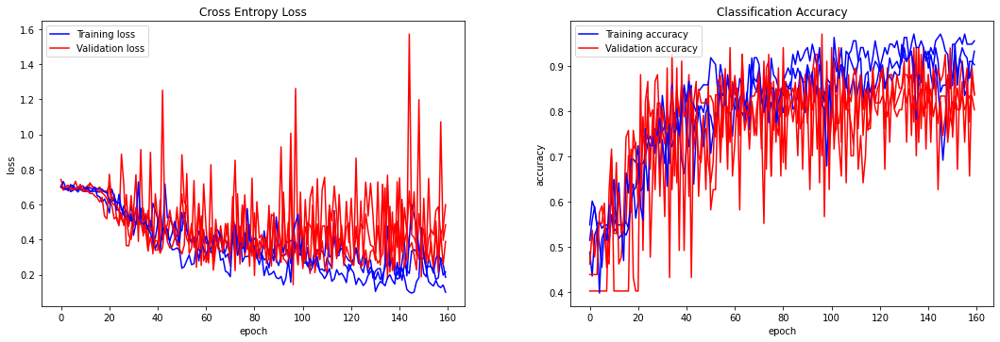

Accuracy: mean=82.489 std=1.546, n=3


In [ ]:
n_folds=3
epochs=160
modeleIDGTiger = define_model()
run_evaluation(modeleIDGTiger, X_tiger_train, y_tiger_train, X_tiger_test, y_tiger_test, n_folds, epochs)

In [ ]:
modeleIDGTiger = define_model()
batches = datagen.flow(X_tiger_train, y_tiger_train, batch_size=32)
history = modeleIDGTiger.fit(batches, validation_data=(X_tiger_test, y_tiger_test), epochs=epochs, batch_size=32)

Epoch 1/160
4/4 [==============================] - 5s 892ms/step - loss: 0.7315 - accuracy: 0.5083 - val_loss: 0.6895 - val_accuracy: 0.5875
Epoch 2/160
4/4 [==============================] - 3s 799ms/step - loss: 0.6830 - accuracy: 0.6000 - val_loss: 0.7046 - val_accuracy: 0.4250
Epoch 3/160
4/4 [==============================] - 3s 808ms/step - loss: 0.6818 - accuracy: 0.5417 - val_loss: 0.7296 - val_accuracy: 0.4125
Epoch 4/160
4/4 [==============================] - 3s 864ms/step - loss: 0.6973 - accuracy: 0.5333 - val_loss: 0.6987 - val_accuracy: 0.4375
Epoch 5/160
4/4 [==============================] - 3s 811ms/step - loss: 0.6815 - accuracy: 0.5583 - val_loss: 0.6978 - val_accuracy: 0.4125
Epoch 6/160
4/4 [==============================] - 3s 852ms/step - loss: 0.6700 - accuracy: 0.5917 - val_loss: 0.7109 - val_accuracy: 0.4375
Epoch 7/160
4/4 [==============================] - 3s 852ms/step - loss: 0.6810 - accuracy: 0.5417 - val_loss: 0.6972 - val_accuracy: 0.4125
Epoch 8/160
4

3/3 [==============================] - 1s 131ms/step
Accuracy sur le jeu de test 0.5875


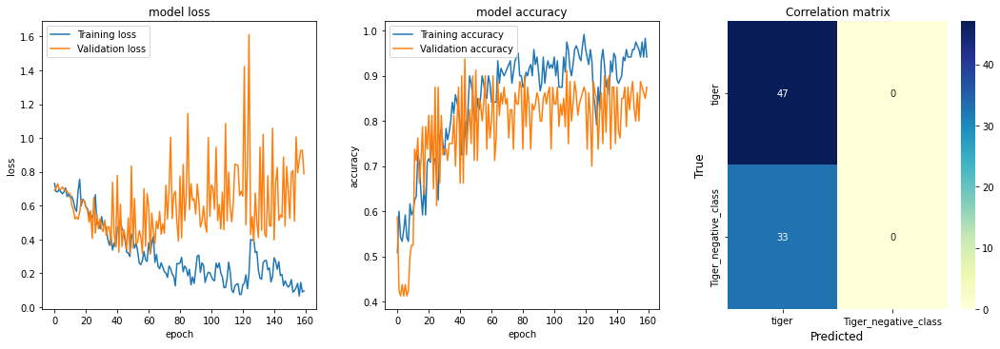

In [ ]:
predict_y = modeleIDGTiger.predict(X_tiger_test)
y_pred=np.argmax(predict_y, axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_tiger_test, y_pred))
conf=confusion_matrix(y_tiger_test, y_pred)
plot_curves_confusion(history, conf, my_classes_tiger)

### modeleIDGFox

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling 1
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 1
  model.add(Dropout(0.4))
  # Convolution and pooling 2
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 2
  model.add(Dropout(0.4))
  # Flatten
  model.add(Flatten())
  # Dropouts 3
  model.add(Dropout(0.4))
  # Partie classification
  model.add(Dense(units=256, activation='relu'))
  # Dropouts 4
  model.add(Dropout(0.4))
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 61, 61, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 61, 61, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 59, 59, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 29, 29, 64)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 29, 29, 64)        0

<ipython-input-7-42f60c2d3e4e>:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-7-42f60c2d3e4e>:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



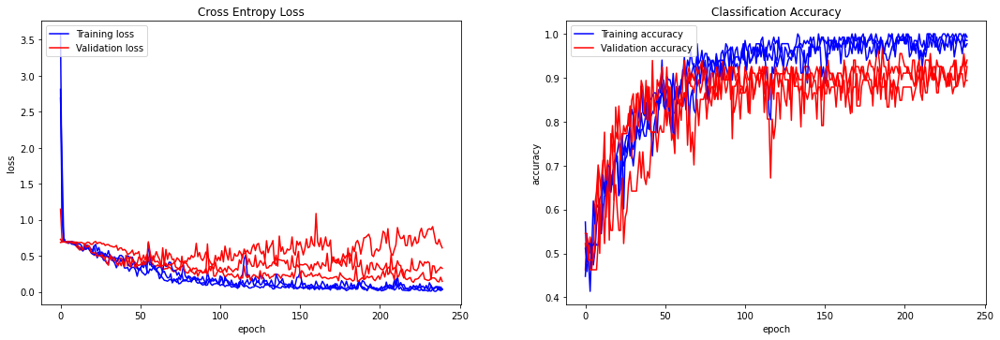

Accuracy: mean=91.987 std=1.932, n=3


In [ ]:
n_folds=3
epochs=240
modeleIDGFox = define_model()
run_evaluation(modeleIDGFox, X_fox_train, y_fox_train, X_fox_test, y_fox_test, n_folds, epochs)

In [ ]:
modeleIDGFox = define_model()
batches = datagen.flow(X_fox_train, y_fox_train, batch_size=32)
history = modeleIDGFox.fit(batches, validation_data=(X_fox_test, y_fox_test), epochs=epochs, batch_size=32)

Epoch 1/240
4/4 [==============================] - 5s 1s/step - loss: 3.3099 - accuracy: 0.5167 - val_loss: 0.6877 - val_accuracy: 0.5250
Epoch 2/240
4/4 [==============================] - 4s 1s/step - loss: 1.2008 - accuracy: 0.5083 - val_loss: 0.6835 - val_accuracy: 0.5625
Epoch 3/240
4/4 [==============================] - 6s 1s/step - loss: 0.8637 - accuracy: 0.5083 - val_loss: 0.6927 - val_accuracy: 0.4875
Epoch 4/240
4/4 [==============================] - 4s 999ms/step - loss: 0.7446 - accuracy: 0.5083 - val_loss: 0.6929 - val_accuracy: 0.4875
Epoch 5/240
4/4 [==============================] - 4s 1s/step - loss: 0.6902 - accuracy: 0.5417 - val_loss: 0.6931 - val_accuracy: 0.5125
Epoch 6/240
4/4 [==============================] - 4s 1s/step - loss: 0.6848 - accuracy: 0.5250 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 7/240
4/4 [==============================] - 4s 999ms/step - loss: 0.6808 - accuracy: 0.4917 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 8/240
4/4 [===========

3/3 [==============================] - 1s 330ms/step
Accuracy sur le jeu de test 0.5125


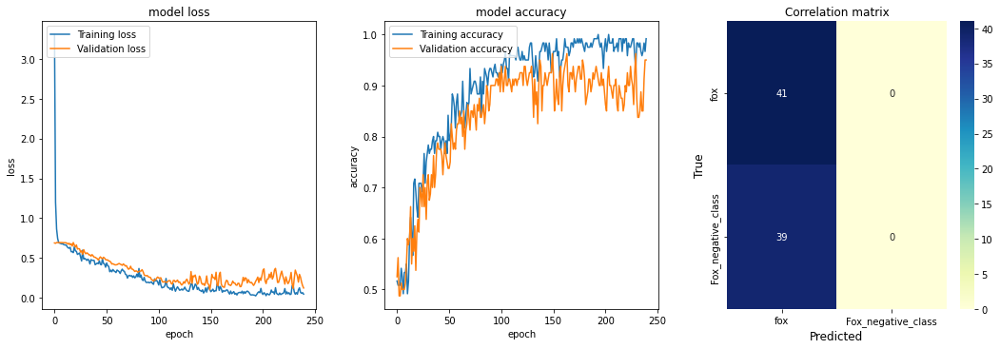

In [ ]:
predict_y = modeleIDGFox.predict(X_fox_test)
y_pred=np.argmax(predict_y,axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_fox_test, y_pred))
conf=confusion_matrix(y_fox_test,y_pred)
plot_curves_confusion(history, conf, my_classes_fox)

In [ ]:
modeleIDGFox.save('modeleIDGFox.h5')

### modeleIDGElephant

In [ ]:
def define_model():
  model = Sequential()
  # Convolution and pooling 1
  model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 1
  model.add(Dropout(0.4))
  # Convolution and pooling 3
  model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  # Dropouts 2
  model.add(Dropout(0.4))
  # Flatten
  model.add(Flatten())
  # Dropouts 3
  model.add(Dropout(0.4))
  # Partie classification
  model.add(Dense(units=256, activation='relu'))
  # Dropouts 4
  model.add(Dropout(0.4))
  model.add(Dense(units=1, activation='sigmoid'))
  # Compile model
  opt = Adam(learning_rate=0.002)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_86 (Conv2D)          (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d_86 (MaxPoolin  (None, 61, 61, 32)       0         
 g2D)                                                            
                                                                 
 dropout_108 (Dropout)       (None, 61, 61, 32)        0         
                                                                 
 conv2d_87 (Conv2D)          (None, 59, 59, 64)        18496     
                                                                 
 max_pooling2d_87 (MaxPoolin  (None, 29, 29, 64)       0         
 g2D)                                                            
                                                                 
 dropout_109 (Dropout)       (None, 29, 29, 64)      

<ipython-input-7-42f60c2d3e4e>:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-7-42f60c2d3e4e>:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



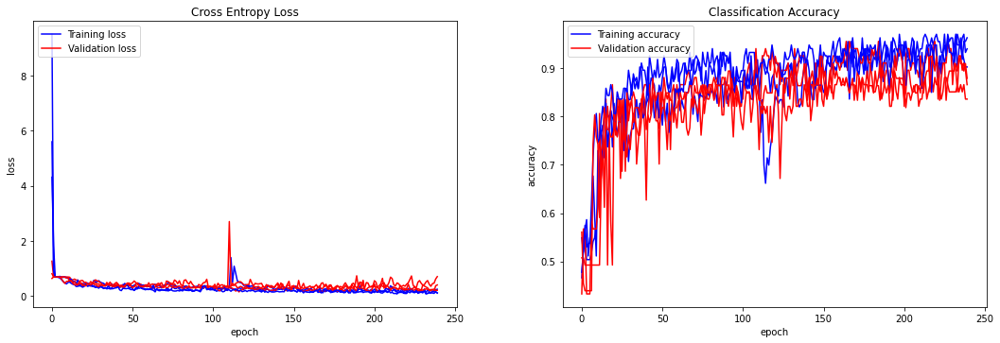

Accuracy: mean=86.009 std=1.798, n=3


In [ ]:
n_folds=3
epochs=240
modeleIDGElephant = define_model()
run_evaluation(modeleIDGElephant, X_elephant_train, y_elephant_train, X_elephant_test, y_elephant_test, n_folds, epochs)

In [ ]:
modeleIDGElephant = define_model()
batches = datagen.flow(X_elephant_train, y_elephant_train, batch_size=32)
history = modeleIDGElephant.fit(batches, validation_data=(X_elephant_test, y_elephant_test), epochs=epochs, batch_size=32)

3/3 [==============================] - 1s 152ms/step
Accuracy sur le jeu de test 0.475


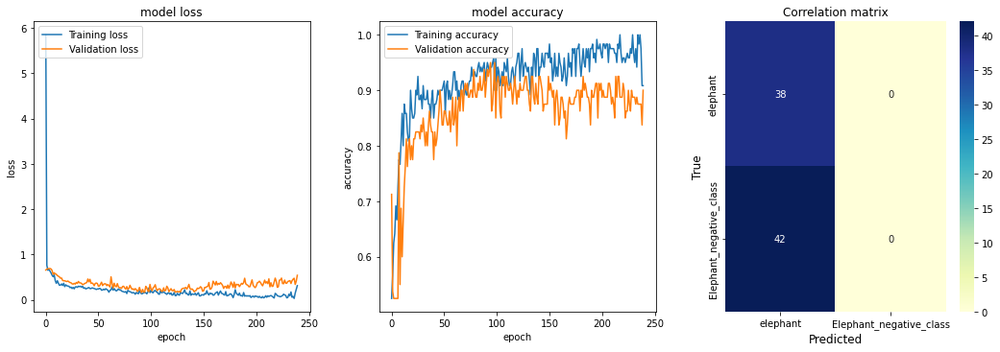

In [ ]:
predict_y = modeleIDGElephant.predict(X_elephant_test)
y_pred=np.argmax(predict_y,axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_elephant_test, y_pred))
conf=confusion_matrix(y_elephant_test, y_pred)
plot_curves_confusion(history, conf, my_classes_elephant)

## 4. Apprentissage par transfert

In [ ]:
from tensorflow.keras.applications.xception import Xception
from keras.engine import training

In [ ]:
datagen = ImageDataGenerator(width_shift_range=0.2,     
                               height_shift_range=0.2,
                               rotation_range=20,
                               zoom_range=0.2,
                               fill_mode="reflect",
                               horizontal_flip=True)

In [ ]:
def define_model():
    base_model=Xception(weights='imagenet', include_top=False)
    for layer in base_model.layers:
      layer.trainable=False
    x=base_model.output
    x=GlobalAveragePooling2D()(x)
    x=Dense(512, activation='relu')(x)
    x=Dense(256, activation='relu')(x)
    preds=Dense(1,activation='sigmoid')(x) #final layer with sigmoid activation
    model=tf.keras.Model(inputs=base_model.input,outputs=preds)
    # compile model
    model.compile(optimizer=Adam(lr=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
def evaluate_model(model, dataX, dataY,datagen, n_folds=5, epochs=10):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)
    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        # selection des données
        model = define_model()
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]
        # fit du modele
        check_point = [
        ModelCheckpoint("modeleTL.h5", monitor='val_accuracy', verbose=1, save_best_only=True)
        #EarlyStopping(monitor='val_accuracy', patience=5, verbose=0)
        ]
        history = model.fit(datagen.flow(X_train, y_train, batch_size=batch_size), epochs=epochs, batch_size=32, validation_data=(X_test, y_test), verbose=1, callbacks = check_point)
        # evaluate du modele
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)
    return scores, histories

In [ ]:
def run_evaluation(model, X_train, y_train, X_test, y_test, n_folds, epochs):
  # definition du modèle 
  model = define_model()
  # On affiche le summary du modèle
  print(model.summary())
  print(X_train.shape)
  # preparation de l'iterateur pour remplir les batchs. 
  datagen = ImageDataGenerator(width_shift_range=0.2,     
                               height_shift_range=0.2,
                               rotation_range=40,
                               zoom_range=0.2,
                               fill_mode="reflect",
                               horizontal_flip=True)
  targets = np.concatenate((y_train, y_test), axis=0)
  inputs = np.concatenate((X_train, X_test), axis=0)

  # appel de la fonction fit. Dans les anciennes versions de Keras
  # mettre fit_generator
  scores, histories = evaluate_model(model, inputs, targets, datagen, n_folds,epochs)
  plot_curves(histories)
  print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))

### modeleTLTiger

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 block1_conv1 (Conv2D)          (None, None, None,   864         ['input_22[0][0]']               
                                32)                                                               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, None, None,   128        ['block1_conv1[0][0]']           
 ation)                         32)                                                        

<ipython-input-7-42f60c2d3e4e>:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-7-42f60c2d3e4e>:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



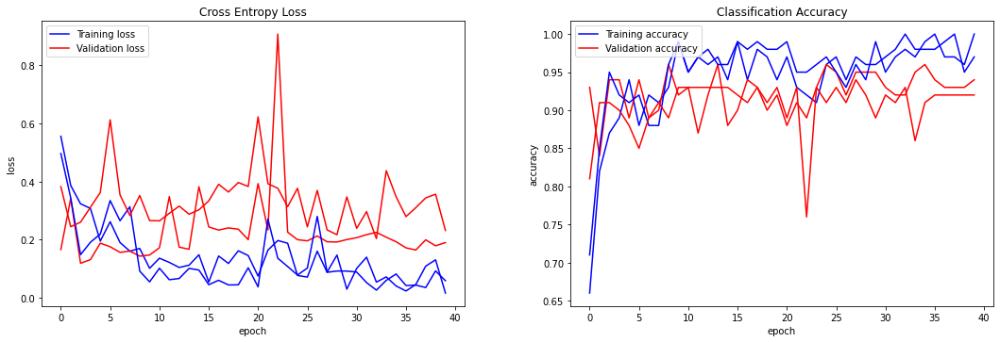

Accuracy: mean=93.000 std=1.000, n=2


In [ ]:
epochs = 40
n_folds = 2
batch_size = 32
modeleTLTiger = define_model()
run_evaluation(modeleTLTiger, X_tiger_train, y_tiger_train, X_tiger_test, y_tiger_test, n_folds, epochs)

In [ ]:
modeleTLTiger = define_model()
batches = datagen.flow(X_tiger_train, y_tiger_train, batch_size=batch_size)
history = modeleTLTiger.fit(batches, validation_data=(X_tiger_test, y_tiger_test), epochs=epochs, batch_size=32)

Epoch 1/40
4/4 [==============================] - 17s 4s/step - loss: 0.5850 - accuracy: 0.6917 - val_loss: 0.3328 - val_accuracy: 0.8000
Epoch 2/40
4/4 [==============================] - 13s 4s/step - loss: 0.3747 - accuracy: 0.8583 - val_loss: 0.3035 - val_accuracy: 0.8875
Epoch 3/40
4/4 [==============================] - 14s 4s/step - loss: 0.2324 - accuracy: 0.9083 - val_loss: 0.2279 - val_accuracy: 0.8875
Epoch 4/40
4/4 [==============================] - 12s 3s/step - loss: 0.1792 - accuracy: 0.9083 - val_loss: 0.2220 - val_accuracy: 0.9250
Epoch 5/40
4/4 [==============================] - 12s 3s/step - loss: 0.1074 - accuracy: 0.9500 - val_loss: 0.1859 - val_accuracy: 0.9375
Epoch 6/40
4/4 [==============================] - 12s 3s/step - loss: 0.1045 - accuracy: 0.9667 - val_loss: 0.2434 - val_accuracy: 0.9250
Epoch 7/40
4/4 [==============================] - 12s 3s/step - loss: 0.1159 - accuracy: 0.9417 - val_loss: 0.1717 - val_accuracy: 0.9500
Epoch 8/40
4/4 [==================

3/3 [==============================] - 6s 1s/step
Accuracy sur le jeu de test 0.5875


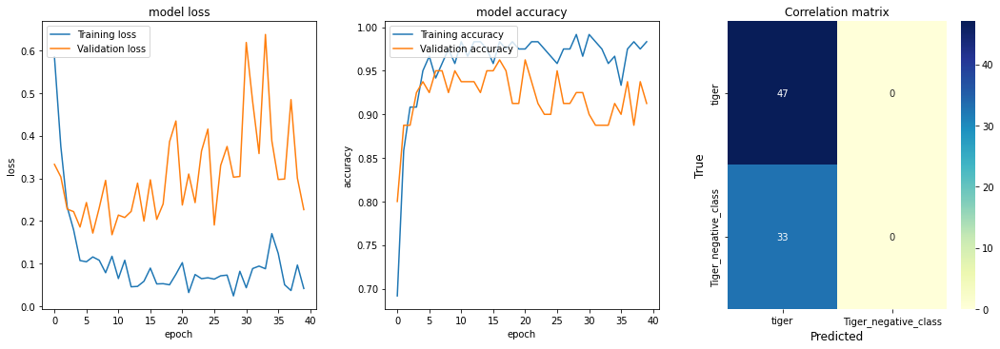

In [ ]:
predict_y = modeleTLTiger.predict(X_tiger_test)
y_pred=np.argmax(predict_y, axis=1)
print("Accuracy sur le jeu de test", accuracy_score(y_tiger_test, y_pred))
conf=confusion_matrix(y_tiger_test, y_pred)
plot_curves_confusion(history,conf,my_classes_tiger)

### modeleTLFox 

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 block1_conv1 (Conv2D)          (None, None, None,   864         ['input_17[0][0]']               
                                32)                                                               
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, None, None,   128        ['block1_conv1[0][0]']           
 ation)                         32)                                                        

<ipython-input-7-42f60c2d3e4e>:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-7-42f60c2d3e4e>:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



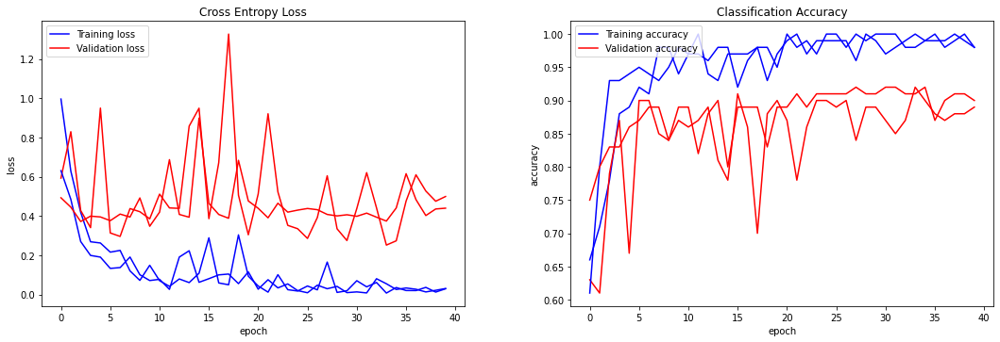

Accuracy: mean=89.500 std=0.500, n=2


In [ ]:
epochs = 40
n_folds = 2
batch_size = 32
modeleTLFox = define_model()
run_evaluation(modeleTLFox, X_fox_train, y_fox_train, X_fox_test, y_fox_test, n_folds, epochs)

In [ ]:
modeleTLFox = define_model()
batches = datagen.flow(X_fox_train, y_fox_train, batch_size=batch_size)
history = modeleTLFox.fit(batches, validation_data=(X_fox_test, y_fox_test), epochs=epochs, batch_size=32)

Epoch 1/40
4/4 [==============================] - 6s 1s/step - loss: 0.7068 - accuracy: 0.5333 - val_loss: 0.6958 - val_accuracy: 0.4875
Epoch 2/40
4/4 [==============================] - 3s 813ms/step - loss: 0.7075 - accuracy: 0.4750 - val_loss: 0.6920 - val_accuracy: 0.5250
Epoch 3/40
4/4 [==============================] - 3s 795ms/step - loss: 0.6876 - accuracy: 0.5333 - val_loss: 0.6913 - val_accuracy: 0.5375
Epoch 4/40
4/4 [==============================] - 3s 797ms/step - loss: 0.6864 - accuracy: 0.5500 - val_loss: 0.6909 - val_accuracy: 0.4875
Epoch 5/40
4/4 [==============================] - 3s 792ms/step - loss: 0.6963 - accuracy: 0.5417 - val_loss: 0.6884 - val_accuracy: 0.4875
Epoch 6/40
4/4 [==============================] - 3s 786ms/step - loss: 0.6966 - accuracy: 0.5333 - val_loss: 0.6870 - val_accuracy: 0.4875
Epoch 7/40
4/4 [==============================] - 3s 845ms/step - loss: 0.6765 - accuracy: 0.5667 - val_loss: 0.6814 - val_accuracy: 0.6375
Epoch 8/40
4/4 [=======

3/3 [==============================] - 1s 233ms/step
Accuracy sur le jeu de test 0.5125


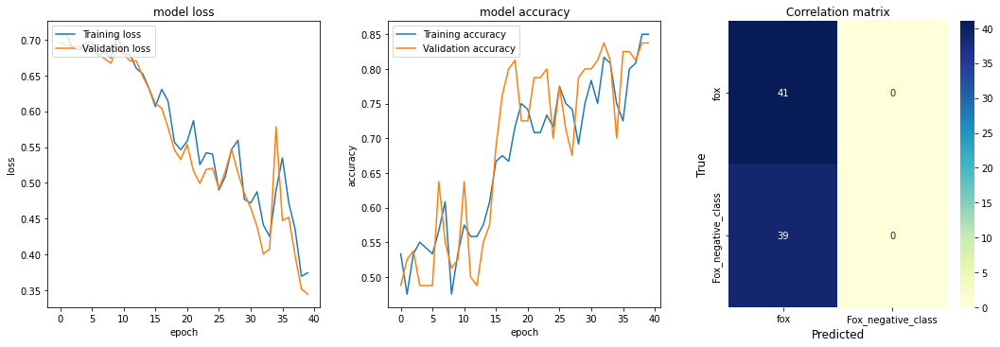

In [ ]:
predict_y = modeleTLFox.predict(X_fox_test)
y_pred = np.argmax(predict_y,axis = 1)
print("Accuracy sur le jeu de test", accuracy_score(y_fox_test, y_pred))
conf = confusion_matrix(y_fox_test, y_pred)
plot_curves_confusion(history, conf, my_classes_fox)

### modeleTLElephant

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_211 (Conv2D)         (None, 122, 122, 32)      896       
                                                                 
 max_pooling2d_134 (MaxPooli  (None, 61, 61, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_212 (Conv2D)         (None, 59, 59, 32)        9248      
                                                                 
 max_pooling2d_135 (MaxPooli  (None, 29, 29, 32)       0         
 ng2D)                                                           
                                                                 
 dropout_168 (Dropout)       (None, 29, 29, 32)        0         
                                                                 
 conv2d_213 (Conv2D)         (None, 27, 27, 64)      

<ipython-input-7-42f60c2d3e4e>:86: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

<ipython-input-7-42f60c2d3e4e>:94: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



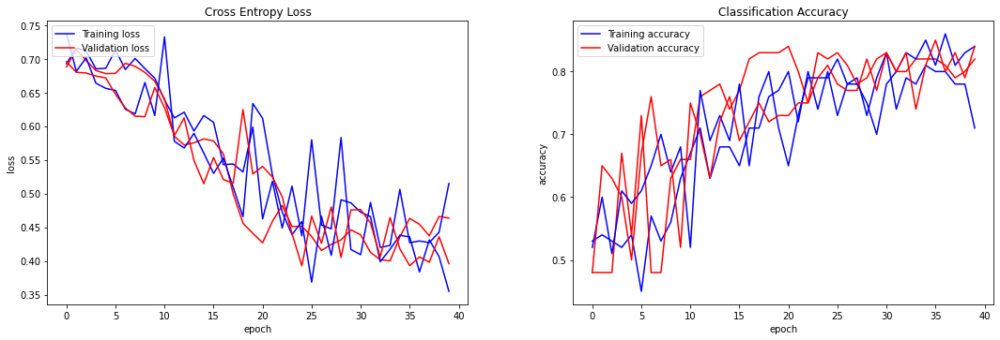

Accuracy: mean=83.000 std=1.000, n=2


In [ ]:
epochs = 40
n_folds = 2
batch_size = 32
modeleTLElephant = define_model()
run_evaluation(modeleTLElephant, X_elephant_train, y_elephant_train, X_elephant_test, y_elephant_test, n_folds, epochs)

In [ ]:
modeleTLElephant = define_model()
batches = datagen.flow(X_elephant_train, y_elephant_train, batch_size=batch_size)
history = modeleTLElephant.fit(batches, validation_data=(X_elephant_test, y_elephant_test), epochs=epochs, batch_size=32)

Epoch 1/40
4/4 [==============================] - 5s 905ms/step - loss: 0.7174 - accuracy: 0.5333 - val_loss: 0.6774 - val_accuracy: 0.7375
Epoch 2/40
4/4 [==============================] - 3s 811ms/step - loss: 0.6851 - accuracy: 0.5417 - val_loss: 0.6666 - val_accuracy: 0.5625
Epoch 3/40
4/4 [==============================] - 3s 796ms/step - loss: 0.6692 - accuracy: 0.5833 - val_loss: 0.6476 - val_accuracy: 0.7250
Epoch 4/40
4/4 [==============================] - 3s 807ms/step - loss: 0.6454 - accuracy: 0.6667 - val_loss: 0.6322 - val_accuracy: 0.7500
Epoch 5/40
4/4 [==============================] - 3s 797ms/step - loss: 0.6307 - accuracy: 0.6333 - val_loss: 0.6072 - val_accuracy: 0.7500
Epoch 6/40
4/4 [==============================] - 3s 799ms/step - loss: 0.6015 - accuracy: 0.7167 - val_loss: 0.5810 - val_accuracy: 0.7375
Epoch 7/40
4/4 [==============================] - 3s 791ms/step - loss: 0.5760 - accuracy: 0.7250 - val_loss: 0.5496 - val_accuracy: 0.7375
Epoch 8/40
4/4 [====

3/3 [==============================] - 1s 127ms/step
Accuracy sur le jeu de test 0.475


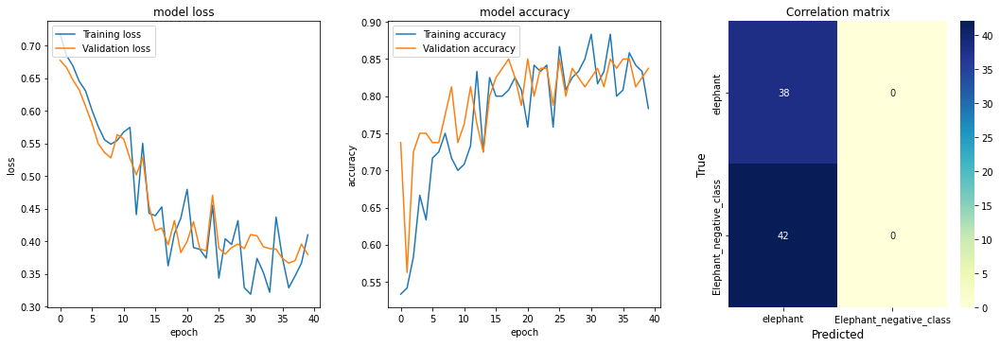

In [ ]:
predict_y = modeleTLElephant.predict(X_elephant_test)
y_pred = np.argmax(predict_y, axis = 1)
print("Accuracy sur le jeu de test", accuracy_score(y_elephant_test, y_pred))
conf=confusion_matrix(y_elephant_test, y_pred)
plot_curves_confusion(history, conf, my_classes_elephant)

## 5. Prédiction d'images générées avec un GAN

In [ ]:
def create_gan(generator_model, discriminator_model):
  # les poids du discriminateur sont non trainable
  discriminator_model.trainable = False
  # un seul modele qui regroupe 
  model = Sequential()
  # couche générateur
  model.add(generator_model)
  # couche discriminateur
  model.add(discriminator_model)
  # compilatin du modèle
  opt = Adam(learning_rate=0.0003, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt)
  return model

In [ ]:
def create_discriminator():
  model = Sequential()
  model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=[124,124,3]))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.3))
  model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.3))
  model.add(Flatten())
  model.add(Dense(1, activation='sigmoid'))
  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [ ]:
def create_generator(latent_dim=100):
  model = Sequential()
	# 1/4 d'image 7x7 * nbr d'images possibles
  n_nodes = 128 * 31 * 31
  model.add(Dense(n_nodes, input_dim=latent_dim))
  model.add(BatchNormalization())
  model.add(LeakyReLU(alpha=0.2))
  model.add(Reshape((31, 31, 128)))
  # upsample to 14x14
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(BatchNormalization()) 		
  model.add(LeakyReLU(alpha=0.2))
  # upsample to 28x28
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU(alpha=0.2))
  model.add(Conv2D(3, (31,31), activation='sigmoid', padding='same'))
  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [ ]:
def generate_latent_points (latent_dim, nb_images):
  X_input = np.random.randn(latent_dim * nb_images)
  X_input = X_input.reshape(nb_images, latent_dim)
  return X_input

def generate_fake_samples_for_generator(generator_model, latent_dim, nb_images):
  # generation des points 
  X_input = generate_latent_points (latent_dim,nb_images)
  # prediction de la sortie du générateur
  X = generator_model.predict(X_input)
  # A ce niveau on considère que les images sont fausses
  # donc on met 0 comme label. 
  y = zeros((nb_images, 1))
  return X, y    

def plot_and_save_generatedimages(generated_images, epoch, nb_images=5):
	# Affichage des images
	for i in range(nb_images):
		plt.subplot(nb_images, nb_images, 1 + i)
		plt.axis('off')
		plt.imshow(generated_images[i, :, :])
	# sauvegarde de l'image
	filename = 'generated_plot_FashionCNN_withGan%03d.png' % (epoch+1)
	plt.savefig(filename)
	plt.close()
 
def evaluate_model (dataset, epoch, generator_model, discriminator_model, latent_dim, nb_images=10, save_model=True):
  # récupération de vraies images pour le discriminateur
  X_real, y_real = generate_real_samples(dataset, nb_images)
  # Evaluation de l'accuracy pour le discriminateur
  _, acc_real = discriminator_model.evaluate(X_real, y_real, verbose=0)

  # génération de fausses images pour le générateur et donc le gan
  X_fake, y_fake = generate_fake_samples_for_generator(generator_model, latent_dim, nb_images)
  # Evaluation du discriminateur avec des fausses images
  _, acc_fake = discriminator_model.evaluate(X_fake, y_fake, verbose=0)

  print ('Accuracy reélle : %.0f%%, fausse : %.0f%%' % (acc_real*100, acc_fake*100))
  
  plot_and_save_generatedimages(X_fake, epoch)
  if save_model==True:
    # sauvegarde du generateur pour un autre usage
    filename = 'generator_model_FashionMNIST%03d.h5' % (epoch + 1)
    generator_model.save(filename)

In [ ]:
def train(generator_model, discriminator_model, gan_model, dataset, latent_dim, epochs=100, batchsize=256):
  # Pour déterminer combien il y aura de batchs analysés à chaque epoch
  batches_per_epoch = int(dataset.shape[0] / batchsize)
  # Pour récupérer le même nombre d'images fausses et vraies
  half_batch = int(batchsize / 2)

  for i in range(epochs):
    # parcours des batches pour chaque pas d'epoch
    for j in range(batches_per_epoch):
      # Discriminator
      # tirage aléatoire de half_batch images vraies
      X_real, y_real = generate_real_samples(dataset, half_batch)
      # generation de half_size fausses images
      X_fake, y_fake = generate_fake_samples_for_generator(generator_model, latent_dim, half_batch)
      # vstack permet de concaténer les vraies et fausses images dans X (resp. dans y)
      # on aurait pu utiliser np.concatenate (np.concatenate([X_real, X_fake]))
      X, y = vstack((X_real, X_fake)), vstack((y_real, y_fake))
      # La ligne suivante permet au discriminateur de mettre à jour ses poids
      # attention dans le GAN il ne peut pas aprendre donc il ne peut le faire qu'ici
      discriminator_loss,_  = discriminator_model.train_on_batch(X, y)
      # L'entrée du GAN
      # Création des points comme entrée du générateur 
      X_for_gan = generate_latent_points(latent_dim, batchsize)
      # On met un 1 pour les labels des fausses images pour faire croire au discriminateur
      # qu'il s'agit de vraies images
      y_for_gan = ones((batchsize, 1))

      # mise à jour des poids du générateur par propagation de l'esseur
      # du discriminateur 
      gan_loss = gan_model.train_on_batch(X_for_gan, y_for_gan)
			# Affichage des loss
      print('epoch %d - batch %d/%d, discriminator_loss=%.3f, generator_loss=%.3f'%(i+1, j+1, batches_per_epoch, discriminator_loss, gan_loss))

    # Toutes les 20 epochs evaluation du modèle et sauvegarde du générateur
    if i==1 or (i+1) % 20==0:
        evaluate_model (dataset, i, generator_model, discriminator_model, latent_dim)

In [ ]:
training_data=[]
print(os.listdir("Data_Project/Tiger-Fox-Elephant/fox"))
for img in os.listdir("Data_Project/Tiger-Fox-Elephant/fox"):
    try:
        img_array = cv2.imread(os.path.join("Data_Project/Tiger-Fox-Elephant/fox", img), cv2.IMREAD_UNCHANGED)
        new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
        training_data.append([new_array])
    except Exception as e:
        pass  
X = []
for features in training_data:
        X.append(features)
X=np.array(X).reshape(-1,IMG_SIZE, IMG_SIZE, 3)

['109037.jpg', '109069.jpg', '109020.jpg', '109012.jpg', '109041.jpg', '109080.jpg', '109027.jpg', '109072.jpg', '109036.jpg', '109055.jpg', '109003.jpg', '109028.jpg', '109065.jpg', '109061.jpg', '109088.jpg', '109058.jpg', '109009.jpg', '109052.jpg', '109035.jpg', '109013.jpg', '109087.jpg', '109011.jpg', '109074.jpg', '109015.jpg', '109085.jpg', '109054.jpg', '109068.jpg', '109060.jpg', '109053.jpg', '109043.jpg', '109010.jpg', '109094.jpg', '109064.jpg', '109014.jpg', '109089.jpg', '109075.jpg', '109063.jpg', '109086.jpg', '109030.jpg', '109021.jpg', '109018.jpg', '109008.jpg', '109047.jpg', '109031.jpg', '109039.jpg', '109091.jpg', '109090.jpg', '109040.jpg', '109099.jpg', '109079.jpg', '109005.jpg', '109034.jpg', '109056.jpg', '109004.jpg', '109001.jpg', '109038.jpg', '109002.jpg', '109046.jpg', '109044.jpg', '109092.jpg', '109016.jpg', '109045.jpg', '109093.jpg', '109017.jpg', '109025.jpg', '109019.jpg', '109073.jpg', '109006.jpg', '109032.jpg', '109082.jpg', '109022.jpg', '1090

In [ ]:
def load_data(X):
  #X = expand_dims(X, axis=-1)
  print(X.shape)
  # Normalisation
  X = X.astype('float32')
  X = X / 255.0
  print(X.shape)
  return X

In [ ]:
def generate_real_samples(dataset, nb_images):
	# tirage aléatoire
	ix = randint(0, dataset.shape[0], nb_images)
	# sélection des images
	X = dataset[ix]
	# mettre 1 comme label de classe
	y = ones((nb_images, 1))
	return X, y

In [ ]:
latent_dim = 100
epochs=200
batchsize=32
# Creation du discriminateur
discriminator_model = create_discriminator()
# Creation du generateur
generator_model = create_generator(latent_dim)
# Creation du GAN
gan_model = create_gan(generator_model, discriminator_model)
# Chargement des données
dataset = load_data(X)
print(dataset.shape)

2022-12-08 12:48:43.199354: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


(100, 124, 124, 3)
(100, 124, 124, 3)
(100, 124, 124, 3)


In [ ]:
train(generator_model, discriminator_model, gan_model, dataset, latent_dim, epochs, batchsize)

1/1 [==============================] - 31s 31s/step


2022-12-08 12:50:23.830015: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 7565484032 exceeds 10% of free system memory.
tcmalloc: large alloc 7565484032 bytes == 0x6fb12000 @  0x7f680e365b6b 0x7f680e385379 0x7f67c4db4d5c 0x7f67b182bb9b 0x7f67b18c17dd 0x7f67b16e7bea 0x7f67b16eaa31 0x7f67bcfcb9e9 0x7f67b1a5864b 0x7f67b19ff761 0x7f67bf7468b5 0x7f67bf7445e3 0x7f67b214633b 0x7f680dd476db 0x7f680e08061f
2022-12-08 12:50:23.836680: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 7565484032 exceeds 10% of free system memory.
tcmalloc: large alloc 7565484032 bytes == 0x23ce1c000 @  0x7f680e365b6b 0x7f680e385379 0x7f67c4db4d5c 0x7f67b182bb9b 0x7f67b18c17dd 0x7f67b16e7bea 0x7f67b16eaa31 0x7f67bcf0171e 0x7f67b1a5864b 0x7f67b19ff761 0x7f67bf7468b5 0x7f67bf7445e3 0x7f67b214633b 0x7f680dd476db 0x7f680e08061f


## 6. Contenu des sorties CNN du modèle modeleIDGFox

In [ ]:
loadedModeleIDGFox = load_model('modeleIDGFox.h5')

In [ ]:
images = X_fox_train[10]
# extension des dimensions pour manipuler une seule image
images = np.expand_dims(images, axis=0)
layer_names = [layer.name for layer in loadedModeleIDGFox.layers]
feature_map_layer1 = tf.keras.models.Model(inputs = loadedModeleIDGFox.inputs , outputs = loadedModeleIDGFox.layers[1].output)
features=feature_map_layer1.predict(images)

1/1 [==============================] - 0s 77ms/step


In [ ]:
list_layer_conv=[0, 3]
# Selection des couches correspondant aux convolutions
outputs = [loadedModeleIDGFox.layers[i].output for i in list_layer_conv]
feature_maps_model = tf.keras.models.Model(inputs = loadedModeleIDGFox.inputs , outputs=outputs)

feature_maps = feature_maps_model.predict(images)

1/1 [==============================] - 0s 142ms/step


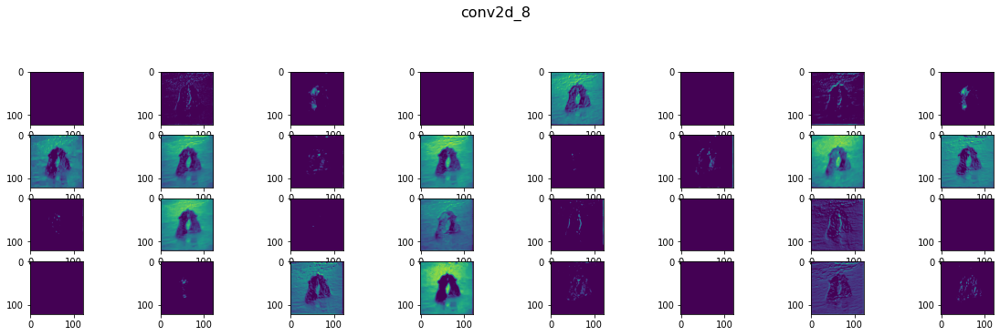

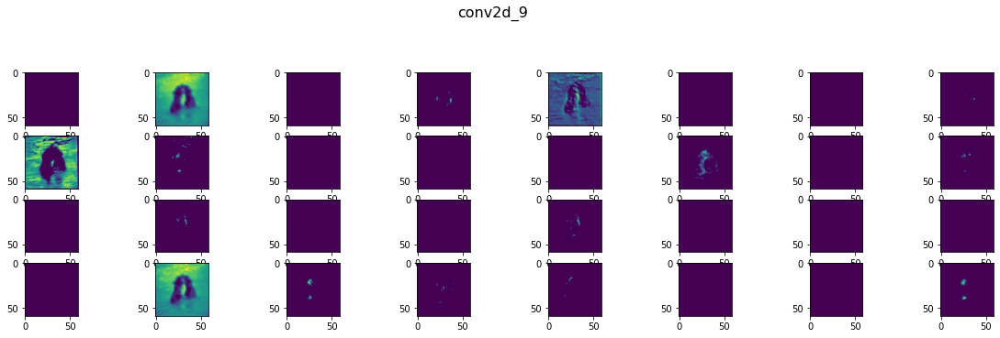

In [ ]:
for i,fmap in zip(list_layer_conv, feature_maps):
    fig = plt.figure(figsize=(20,10))
    fig.suptitle(layer_names[i] , fontsize=16)
    for i in range(1,features.shape[3]+1):
        plt.subplot(8,8,i)
        plt.imshow(fmap[0,:,:,i-1] )
plt.show()